# NBS --> All Scans | Different Design Matrix Configurations

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import os.path as osp
import os
from tqdm import tqdm
from shutil import rmtree
import seaborn as sns
import matplotlib.pyplot as plt
from utils.plotting import hvplot_fc
from scipy.spatial.distance import squareform
from utils.basics import SNYCQ_W_PATH, SNYCQ_CLUSTERS_INFO_PATH, RESOURCES_DINFO_DIR,RESOURCES_NBS_DIR, ATLASES_DIR, DATA_DIR, PRJ_DIR
from utils.basics import FB_400ROI_ATLAS_NAME as ATLAS_NAME
from sfim_lib.io.afni import load_netcc
import panel as pn
FINAL_SCAN_LISTS = {}

In [2]:
from sklearn.preprocessing import OneHotEncoder
import hvplot.pandas

In [3]:
import os
port_tunnel = int(os.environ['PORT2'])
print('++ INFO: Second Port available: %d' % port_tunnel)

++ INFO: Second Port available: 42883


# 1. Load Information about scans
Load ROI information: label, hemisphere, etc..

In [4]:
ATLASINFO_PATH = osp.join(ATLASES_DIR,ATLAS_NAME,'{ATLAS_NAME}.roi_info.csv'.format(ATLAS_NAME=ATLAS_NAME))
roi_info       = pd.read_csv(ATLASINFO_PATH)
Nrois          = roi_info.shape[0]

Load x,y on low dimensional space for each scan

In [5]:
W = pd.read_csv(SNYCQ_W_PATH,index_col=['Subject','Run'])

Load cluster membershipt for each scan

In [6]:
clusters_info = pd.read_csv(SNYCQ_CLUSTERS_INFO_PATH, index_col=['Subject','Run'])

Load motion information for each scan

In [7]:
mot_info = pd.read_csv(osp.join(RESOURCES_DINFO_DIR,'motion_confounds.csv'),index_col=['Subject','Run'])

Combine all info we have about the scans into a single dataframe

In [8]:
SCAN_INFO_df = pd.concat([W,clusters_info,mot_info],axis=1)
SCAN_INFO_df.head(2)

Factor 1  Factor 2  Cluster ID  \
Subject    Run                                                         
sub-010014 post-ses-02-run-01-acq-AP  0.842570  0.621762           3   
           post-ses-02-run-01-acq-PA  0.861308  0.890006           3   

                                     Cluster Label  Mean Rel Motion  
Subject    Run                                                       
sub-010014 post-ses-02-run-01-acq-AP  Intermediate         0.090026  
           post-ses-02-run-01-acq-PA  Intermediate         0.062215

<Axes: xlabel='Factor 1', ylabel='Factor 2'>

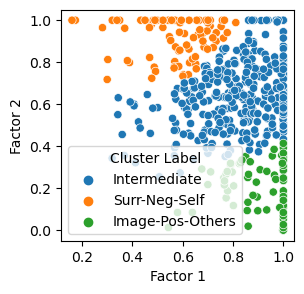

In [9]:
plt.subplots(1,1,figsize=(3,3))
sns.scatterplot(data=SCAN_INFO_df,x='Factor 1',y='Factor 2', hue='Cluster Label')

Remove scans in intermediate cluster

<Axes: xlabel='Factor 1', ylabel='Factor 2'>

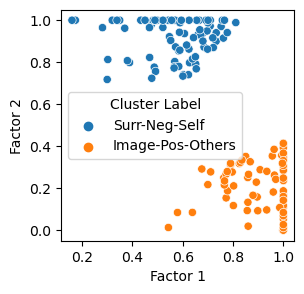

In [10]:
SCAN_INFO_df = SCAN_INFO_df[SCAN_INFO_df['Cluster Label'] != 'Intermediate']
plt.subplots(1,1,figsize=(3,3))
sns.scatterplot(data=SCAN_INFO_df,x='Factor 1',y='Factor 2', hue='Cluster Label')

In [11]:
del mot_info, clusters_info, W

In [12]:
sbj_list       = SCAN_INFO_df.index.get_level_values('Subject').unique()
print('++ Original Number of subjects: %d subjects' % len(sbj_list))
print(sbj_list[0:5])

++ Original Number of subjects: 83 subjects
Index(['sub-010014', 'sub-010080', 'sub-010082', 'sub-010015', 'sub-010094'], dtype='object', name='Subject')


Add this complete list of scans to the ```FINAL_SCAN_LISTS``` dictionary

In [13]:
FINAL_SCAN_LISTS['All_Scans'] = SCAN_INFO_df.copy()
FINAL_SCAN_LISTS['All_Scans']['Cluster Label'].value_counts()

Image-Pos-Others    81
Surr-Neg-Self       78
Name: Cluster Label, dtype: int64

# 2. Create other scan lists of interest

Nothing else here yet.
***

# 3. Prepare for NBS

a. Decide on whic of the many created lists of scans you want to work with

In [14]:
FINAL_SELECTION   = 'All_Scans'
SELECTED_SCANS    = FINAL_SCAN_LISTS[FINAL_SELECTION]
SELECTED_SCANS.head(3)

Factor 1  Factor 2  Cluster ID  \
Subject    Run                                                         
sub-010014 post-ses-02-run-02-acq-AP  0.709076  0.972487           2   
           post-ses-02-run-02-acq-PA  0.680004  0.938335           2   
sub-010080 post-ses-02-run-02-acq-PA  1.000000  0.400438           1   

                                         Cluster Label  Mean Rel Motion  
Subject    Run                                                           
sub-010014 post-ses-02-run-02-acq-AP     Surr-Neg-Self         0.087601  
           post-ses-02-run-02-acq-PA     Surr-Neg-Self         0.070103  
sub-010080 post-ses-02-run-02-acq-PA  Image-Pos-Others         0.092674

b. Show some basic information for the selected list of scans

In [15]:
FINAL_N_scans = SELECTED_SCANS.index.get_level_values('Subject').shape[0]
FINAL_N_sbjs  = SELECTED_SCANS.index.get_level_values('Subject').unique().shape[0]
print('++ Number of scans across both clustes: %d scans' % FINAL_N_scans)
print('++ Number of subjects across both clusters: %d subjects' % FINAL_N_sbjs)
print('++ Number of scans per cluster')
SELECTED_SCANS['Cluster Label'].value_counts()

++ Number of scans across both clustes: 159 scans
++ Number of subjects across both clusters: 83 subjects
++ Number of scans per cluster


Image-Pos-Others    81
Surr-Neg-Self       78
Name: Cluster Label, dtype: int64

***
# 4. Load the FC matrices for all scans in an Xarray

This xarray will be indexed by ```<SBJ>.<SCAN>``` on the scan dimension

In [16]:
%%time
# Create Empty Numpy Array where to hold all FC matrices. At the end we will move this into an Xarray
# ===================================================================================================
sfc_Z_arr      = np.empty((FINAL_N_scans,Nrois,Nrois)) * np.nan
print('++ INFO: Shape of final Xarray: %s' % str(sfc_Z_arr.shape))
i              = 0  # Index to move through the scan dimension numerically
xr_coords_scan = [] # List of scan IDs to later use as the coordinates for the scan dimension

# For each scan in a given cluster
# ================================
for (sbj,run),_ in tqdm(SELECTED_SCANS.iterrows()):
    # Load FC matrix from disk
    # ========================
    xr_coords_scan.append('.'.join([sbj,run])) 
    _,_,sesID,_,runID,_,acqID = run.split('-')
    sfc_path = osp.join(DATA_DIR,'PrcsData',sbj,'preprocessed','func','pb06_staticFC','{acqID}_run-{runID}.{ATLAS_NAME}_000.netcc'.format(acqID=acqID,runID=runID, ATLAS_NAME=ATLAS_NAME))
    aux_cc_r = load_netcc(sfc_path)
    # Apply Fisher's transformation
    # =============================
    aux_cc_Z = aux_cc_r.apply(np.arctanh)
    np.fill_diagonal(aux_cc_Z.values,1)
    sfc_Z_arr[i,:,:] = aux_cc_Z
    # Update counter
    # ==============
    i = i + 1
    del aux_cc_r, aux_cc_Z

# Save all FC matrixes for a given atlas in XR.Array Form
# =======================================================
sfc_Z_xr = xr.DataArray(sfc_Z_arr,
                    dims=['scan','roi_x','roi_y'],
                    coords={'scan':xr_coords_scan ,
                            'roi_x':roi_info['ROI_ID'],
                            'roi_y':roi_info['ROI_ID']})
del sfc_Z_arr

++ INFO: Shape of final Xarray: (159, 380, 380)


159it [00:07, 21.79it/s]

CPU times: user 3.17 s, sys: 249 ms, total: 3.42 s
Wall time: 7.42 s


***
# 5. Create Materials to run NBS

a. Create folder for this particular Atlas / Final Selection in NBS resource folder. If folder already exists, a warning will be given.

In [17]:
MY_NBS_FOLDER = osp.join(RESOURCES_NBS_DIR, ATLAS_NAME, FINAL_SELECTION)
if osp.exists(MY_NBS_FOLDER):
    print('++ WARNING: %s already exists... \n   you may want to delete prior results to avoid confussion.' % MY_NBS_FOLDER)
else:
    os.makedirs(MY_NBS_FOLDER)
    print('++ INFO: New folder created %s' % MY_NBS_FOLDER)

++ WARNING: /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans already exists... 
   you may want to delete prior results to avoid confussion.


b. Create subfolder where the FC matrices will be saved in a way that NBS can understand.

In [18]:
FC_MATRIX_DATA_FOLDER = osp.join(MY_NBS_FOLDER,'NBS_CL02_Data')
if osp.exists(FC_MATRIX_DATA_FOLDER):
    print('++ WARNING: Removing prior data folder [%s]' % FC_MATRIX_DATA_FOLDER)
    rmtree(FC_MATRIX_DATA_FOLDER)
print('++ INFO: Creating new data folder [%s]' % FC_MATRIX_DATA_FOLDER)
os.makedirs(FC_MATRIX_DATA_FOLDER)

++ WARNING: Removing prior data folder [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/NBS_CL02_Data]
++ INFO: Creating new data folder [/data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/NBS_CL02_Data]


c. Define path to both NBS design matrix: one with only two columns, and another one with the extra columns per subject

In [19]:
DESING_MATRIX_PATH             = osp.join(MY_NBS_FOLDER,'NBS_CL02_DesingMatrix.txt')
DESING_MATRIX_AUGMENTED_PATH   = osp.join(MY_NBS_FOLDER,'NBS_CL02_DesingMatrix_Augmented.txt')
DESING_MATRIX_AUGMENTED_B_PATH = osp.join(MY_NBS_FOLDER,'NBS_CL02_DesingMatrix_Augmented_B.txt')
DESING_MATRIX_AUGMENTED_C_PATH = osp.join(MY_NBS_FOLDER,'NBS_CL02_DesingMatrix_Augmented_C.txt')

## 5.1. Create basic matrix

In [20]:
FINAL_SCAN_LIST = list(sfc_Z_xr.scan.values)
with open(DESING_MATRIX_PATH, 'w') as the_file:
    for i,idx in tqdm(enumerate(FINAL_SCAN_LIST)):
        sbj,scan = idx.split('.')
        assert tuple(SELECTED_SCANS.reset_index().iloc[i][['Subject','Run']].values) == (sbj,scan), "ERROR --> Something is wrong with the index ordering"
        dest_path = osp.join(FC_MATRIX_DATA_FOLDER,'subject{id}.txt'.format(id=str(i+1).zfill(3)))
        np.savetxt(dest_path,sfc_Z_xr.loc[idx,:,:],delimiter=' ',fmt='%f')
        cl = SELECTED_SCANS.loc[sbj,scan]['Cluster Label']
        if cl == 'Image-Pos-Others':
            the_file.write('1 1\n')
        else:
            the_file.write('1 0\n')
the_file.close()
print('++ INFO[%s,%s]: Basic design matrix saved to disk %s' % (ATLAS_NAME,FINAL_SELECTION, DESING_MATRIX_PATH))

159it [00:06, 25.88it/s]

++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Basic design matrix saved to disk /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/NBS_CL02_DesingMatrix.txt


## 5.2. Create matrix with 1 col for group (-1,1) and then one column per subject

Get list of unique subjects in the order the appear in the Xarray

In [21]:
FINAL_SBJ_LIST = [item.split('.')[0] for item in FINAL_SCAN_LIST]
FINAL_SBJ_LIST_NOREPS = []
for sbj in FINAL_SBJ_LIST:
    if sbj not in FINAL_SBJ_LIST_NOREPS:
        FINAL_SBJ_LIST_NOREPS.append(sbj)

Generate the extra columns with scans per subject information

In [22]:
ONE_HOT_ENCODER_SBJ      = OneHotEncoder(sparse_output=False, dtype=int)
DESIGN_MATRIX_EXTRA_COLS = ONE_HOT_ENCODER_SBJ.fit_transform(np.array(FINAL_SBJ_LIST).reshape(-1,1))
DESIGN_MATRIX_EXTRA_COLS = pd.DataFrame(DESIGN_MATRIX_EXTRA_COLS, columns=ONE_HOT_ENCODER_SBJ.categories_[0])[FINAL_SBJ_LIST_NOREPS].values

In [23]:
fig, ax          = plt.subplots(1,1,figsize=(20,25))
sns.heatmap(DESIGN_MATRIX_EXTRA_COLS, xticklabels=FINAL_SBJ_LIST_NOREPS, yticklabels=FINAL_SCAN_LIST, ax=ax)
plt.close()
dashboard        = pn.Row(pn.pane.Matplotlib(fig));
dashboard_server = dashboard.show(port=port_tunnel,open=False)
print('++ CLICK ON LINK TO SEE MATRIX')

Launching server at http://localhost:42883
++ CLICK ON LINK TO SEE MATRIX


In [24]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

In [25]:
ONE_COLUMN_GROUP_ENCODING = np.array([1 if SELECTED_SCANS.loc[i.split('.')[0],i.split('.')[1]]['Cluster Label'] == 'Image-Pos-Others' else -1 for i in FINAL_SCAN_LIST]).reshape(-1,1)
DESING_MATRIX_AUGMENTED   = np.concatenate([ONE_COLUMN_GROUP_ENCODING,DESIGN_MATRIX_EXTRA_COLS], axis=1)
np.savetxt(DESING_MATRIX_AUGMENTED_PATH,DESING_MATRIX_AUGMENTED,delimiter=' ',fmt='%d')

print('++ INFO[%s,%s]: Augmented design matrix saved to disk %s' % (ATLAS_NAME,FINAL_SELECTION, DESING_MATRIX_AUGMENTED_PATH))
print('++ INFO[%s,%s]: Augmented design matrix shape %s' % (ATLAS_NAME, FINAL_SELECTION, str(DESING_MATRIX_AUGMENTED.shape)))

++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Augmented design matrix saved to disk /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/NBS_CL02_DesingMatrix_Augmented.txt
++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Augmented design matrix shape (159, 84)


In [26]:
dashboard = pn.Column(pn.pane.Markdown('# DESING_MATRIX_AUGMENTED_B'),
                   pd.DataFrame(DESING_MATRIX_AUGMENTED, 
             columns=['Group']+FINAL_SBJ_LIST_NOREPS, 
             index=['.'.join([i,SELECTED_SCANS.loc[i.split('.')[0],i.split('.')[1]]['Cluster Label']]) for i in FINAL_SCAN_LIST]).hvplot.heatmap(width=1500,height=2000).opts(xrotation=90))
dashboard_server = dashboard.show(port=port_tunnel,open=False)
print('++ CLICK ON LINK TO SEE MATRIX')

Launching server at http://localhost:42883
++ CLICK ON LINK TO SEE MATRIX


In [27]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

## 5.3. Same as 5.2 plus an intercept

In [28]:
INTERCEPT_COLUMN            = np.ones((len(FINAL_SCAN_LIST),1), dtype=int)
DESING_MATRIX_AUGMENTED_B   = np.concatenate([INTERCEPT_COLUMN, ONE_COLUMN_GROUP_ENCODING,DESIGN_MATRIX_EXTRA_COLS], axis=1)
np.savetxt(DESING_MATRIX_AUGMENTED_B_PATH,DESING_MATRIX_AUGMENTED_B,delimiter=' ',fmt='%d')

print('++ INFO[%s,%s]: Augmented design matrix saved to disk %s' % (ATLAS_NAME,FINAL_SELECTION, DESING_MATRIX_AUGMENTED_B_PATH))
print('++ INFO[%s,%s]: Augmented design matrix shape %s' % (ATLAS_NAME, FINAL_SELECTION, str(DESING_MATRIX_AUGMENTED_B.shape)))

++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Augmented design matrix saved to disk /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/NBS_CL02_DesingMatrix_Augmented_B.txt
++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Augmented design matrix shape (159, 85)


In [29]:
dashboard = pn.Column(pn.pane.Markdown('# DESING_MATRIX_AUGMENTED_B'),
             pd.DataFrame(DESING_MATRIX_AUGMENTED_B, 
             columns=['Intercept','Group']+FINAL_SBJ_LIST_NOREPS, 
             index=['.'.join([i,SELECTED_SCANS.loc[i.split('.')[0],i.split('.')[1]]['Cluster Label']]) for i in FINAL_SCAN_LIST]).hvplot.heatmap(width=1500,height=2000).opts(xrotation=90))
dashboard_server = dashboard.show(port=port_tunnel, open=False)
print('++ CLICK ON LINK TO SEE MATRIX')

Launching server at http://localhost:42883
++ CLICK ON LINK TO SEE MATRIX


In [30]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

# 5.4. Original T-test matrix + subjects

In [31]:
group_col = []
for item in FINAL_SCAN_LIST:
    sbj,scan = item.split('.')
    cl = SELECTED_SCANS.loc[sbj,scan]['Cluster Label']
    if cl == 'Image-Pos-Others':
        cl = 1
    else:
        cl = 0
    group_col.append(cl)
GROUP_COLUMN     = np.array(group_col, dtype=int).reshape(-1,1)
INTERCEPT_COLUMN = np.ones((len(FINAL_SCAN_LIST),1), dtype=int)


In [32]:
DESING_MATRIX_AUGMENTED_C   = np.concatenate([INTERCEPT_COLUMN, GROUP_COLUMN,DESIGN_MATRIX_EXTRA_COLS], axis=1)
np.savetxt(DESING_MATRIX_AUGMENTED_C_PATH,DESING_MATRIX_AUGMENTED_C,delimiter=' ',fmt='%d')

print('++ INFO[%s,%s]: Augmented design matrix saved to disk %s' % (ATLAS_NAME,FINAL_SELECTION, DESING_MATRIX_AUGMENTED_C_PATH))
print('++ INFO[%s,%s]: Augmented design matrix shape %s' % (ATLAS_NAME, FINAL_SELECTION, str(DESING_MATRIX_AUGMENTED_C.shape)))

++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Augmented design matrix saved to disk /data/SFIMJGC_Introspec/2023_fc_introspection/code/fc_introspection/resources/nbs/Schaefer2018_400Parcels_7Networks_AAL2/All_Scans/NBS_CL02_DesingMatrix_Augmented_C.txt
++ INFO[Schaefer2018_400Parcels_7Networks_AAL2,All_Scans]: Augmented design matrix shape (159, 85)


In [33]:
dashboard = pn.Column(pn.pane.Markdown('# DESING_MATRIX_AUGMENTED_C'),
             pd.DataFrame(DESING_MATRIX_AUGMENTED_C, 
             columns=['Intercept','Group']+FINAL_SBJ_LIST_NOREPS, 
             index=['.'.join([i,SELECTED_SCANS.loc[i.split('.')[0],i.split('.')[1]]['Cluster Label']]) for i in FINAL_SCAN_LIST]).hvplot.heatmap(width=1500,height=2000).opts(xrotation=90))
dashboard_server = dashboard.show(port=port_tunnel, open=False)
print('++ CLICK ON LINK TO SEE MATRIX')

Launching server at http://localhost:42883
++ CLICK ON LINK TO SEE MATRIX


In [34]:
# Once you are done looking at matrices, you can stop the server running this cell
dashboard_server.stop()

# Current Status of results (Oct 26th 2023)

* Results are only available when no intercept column and groups are modeled as 1, -1 ==> Matrix from 5.2

    * Nothing survives for Ima > Surr (T > 3.1)
    * 590 connections (pFWE = 0.034) survive for Surr > Ima ( T > 3.1)
    * 196 connections (pFWE = 0.034) survive for Surr > Ima ( T > 3.5)

* All other attempts throw weird errors in MATLAB --> Most likely due to the matrices being badly formed

***
***
***

# 6. Prepare for 3dLMEr

In [35]:
RESOURCES_3dLMEr_DIR = osp.join(PRJ_DIR,'code','fc_introspection','resources','3dLMEr')
if not osp.exists(RESOURCES_3dLMEr_DIR):
    os.makedirs(RESOURCES_3dLMEr_DIR)

In [36]:
THIS_ATLAS_3dLMEr_DIR = osp.join(RESOURCES_3dLMEr_DIR, ATLAS_NAME)
if not osp.exists(THIS_ATLAS_3dLMEr_DIR):
    os.makedirs(THIS_ATLAS_3dLMEr_DIR)

In [37]:
THIS_SCENARIO_3dLMEr_DIR = osp.join(THIS_ATLAS_3dLMEr_DIR,'All_Scans')
if not osp.exists(THIS_SCENARIO_3dLMEr_DIR):
    os.makedirs(THIS_SCENARIO_3dLMEr_DIR)

In [38]:
FC_MATRICES_DIR = osp.join(THIS_SCENARIO_3dLMEr_DIR ,'Data')
if osp.exists(FC_MATRICES_DIR):
    rmtree(FC_MATRICES_DIR)
os.makedirs(FC_MATRICES_DIR)

In [39]:
for scan in tqdm(FINAL_SCAN_LIST):
    sbj_id, scan_id = scan.split('.')
    this_scan_fc_matrix = sfc_Z_xr.loc[scan].values
    this_scan_fc_vector = squareform(this_scan_fc_matrix, checks=False)
    this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
    np.savetxt(this_scan_fc_vector_path,this_scan_fc_vector,fmt='%.8f')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:12<00:00, 12.25it/s]


In [40]:
analysis_script_path = osp.join(THIS_SCENARIO_3dLMEr_DIR,'All_Scans_3dLMEr.sh')
with open(analysis_script_path, 'w') as the_file:
    the_file.write('module load R\n')
    the_file.write('module load afni\n')
    the_file.write('\n')
    the_file.write('# Is SS = 3 (marginal) the correct type?\n')
    the_file.write('# Should I use bounds given this is Fisher`s of R values\n')
    the_file.write('\n')
    the_file.write('3dLMEr -prefix LME_output        \\\n')
    the_file.write('       -jobs 32                  \\\n')
    the_file.write('       -model  \'Group+(1|Subj)\'  \\\n')
    the_file.write('       -SS_type 3                \\\n')
    the_file.write('       -gltCode Image_Pos_Others \'Group : 1*Image_Pos_Others\'                                \\\n')
    the_file.write('       -gltCode Surr_Neg_Self    \'Group : 1*Surr_Neg_Self\'                                  \\\n')
    the_file.write('       -gltCode Image_Pos_Others-Surr_Neg_Self \'Group : 1*Image_Pos_Others -1*Surr_Neg_Self\' \\\n')
    the_file.write('       -dataTable \\\n')
    the_file.write('        Subj Scan Group InputFile \\\n')
    for scan in tqdm(FINAL_SCAN_LIST):
        sbj_id, scan_id          = scan.split('.')
        this_scan_group          = SCAN_INFO_df.loc[sbj_id,scan_id]['Cluster Label'].replace('-','_')
        this_scan_fc_vector_path = osp.join(FC_MATRICES_DIR,f'{sbj_id}_{scan_id}.1D')
        the_file.write('       %s\t%s\t%s\t%s\t\\\n' % (sbj_id,scan_id,this_scan_group,this_scan_fc_vector_path))
    the_file.write('\n')
    the_file.write('# ===================================================\n')
    the_file.write('\n')
    the_file.write('echo "==================================================================\n"')
    the_file.write('echo "==================================================================\n"')
    the_file.write('3dFDR -qval -input LME_output.1D -prefix LME_output_qval')
the_file.close()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 159/159 [00:00<00:00, 7094.09it/s]


# 7. See 3dLMEr Results

In [41]:
LME_OUTPUT_COLUMNS = ['group.chisq2', 'Image_Pos_Others', 'Image_Pos_Others.Z',
       'Surr_Neg_Self', 'Surr_Neg_Self.Z', 'Image_Pos_Others-Surr_Neg_Self',
       'Image_Pos_Others-Surr_Neg_Self.Z']#,'Surr_Neg_Self-Image_Pos_Others',
#       'Surr_Neg_Self-Image_Pos_Others.Z']
LME_Q_OUTPUT_COLUMNS = ['group.chisq2.q', 'Image_Pos_Others', 'Image_Pos_Others.q',
       'Surr_Neg_Self', 'Surr_Neg_Self.q', 'Image_Pos_Others-Surr_Neg_Self',
       'Image_Pos_Others-Surr_Neg_Self.q']#,'Surr_Neg_Self-Image_Pos_Others',
#       'Surr_Neg_Self-Image_Pos_Others.q']

In [42]:
LME_RESULTS_PATH    = osp.join(THIS_SCENARIO_3dLMEr_DIR,'LME_output.1D')
LME_RESULTS         = pd.read_csv(LME_RESULTS_PATH, sep=' ', comment='#', header=None)
LME_RESULTS         = LME_RESULTS.drop(0,axis=1)
LME_RESULTS.columns = LME_OUTPUT_COLUMNS

In [43]:
LME_RESULTS_Q_PATH = osp.join(THIS_SCENARIO_3dLMEr_DIR,'LME_output_qval.1D')
LME_RESULTS_Q = pd.read_csv(LME_RESULTS_Q_PATH, sep=' ', comment='#', header=None)
LME_RESULTS_Q = LME_RESULTS_Q.drop(0,axis=1)
LME_RESULTS_Q.columns = LME_Q_OUTPUT_COLUMNS

In [44]:
LME_results_matrixes = {}
for data_type in LME_RESULTS.columns:
    LME_results_matrixes[data_type] = squareform(LME_RESULTS[data_type])
for data_type in LME_RESULTS_Q.columns:
    LME_results_matrixes[data_type] = squareform(LME_RESULTS_Q[data_type])

Text(0.5, 1.0, 'Image_Pos_Others-Surr_Neg_Self')

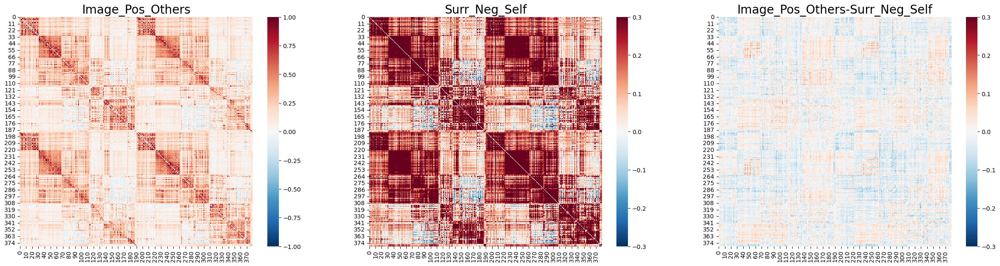

In [45]:
f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(30,7))
g1 = sns.heatmap(LME_results_matrixes['Image_Pos_Others'], cmap='RdBu_r', vmin=-1, vmax=1, ax=ax1)
g2 = sns.heatmap(LME_results_matrixes['Surr_Neg_Self'], cmap='RdBu_r', vmin=-.3, vmax=.3, ax=ax2)
g3 = sns.heatmap(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self'], cmap='RdBu_r', vmin=-.3, vmax=.3, ax=ax3)
g1.set_title('Image_Pos_Others', fontsize=20)
g2.set_title('Surr_Neg_Self', fontsize=20)
g3.set_title('Image_Pos_Others-Surr_Neg_Self',size=20)

Text(0.5, 1.0, 'Image_Pos_Others-Surr_Neg_Self.Z')

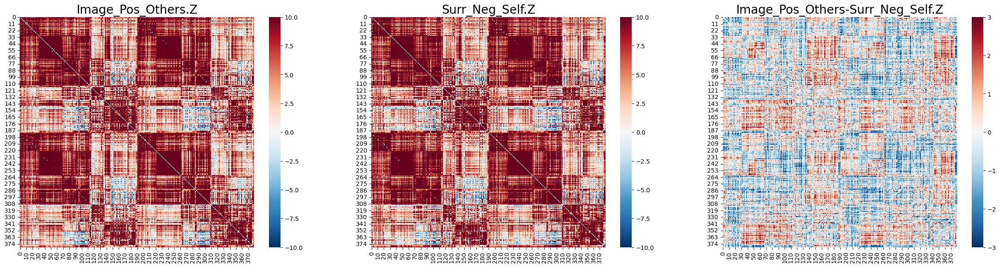

In [46]:
f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(30,7))
g1 = sns.heatmap(LME_results_matrixes['Image_Pos_Others.Z'], cmap='RdBu_r', vmin=-10, vmax=10, ax=ax1)
g2 = sns.heatmap(LME_results_matrixes['Surr_Neg_Self.Z'], cmap='RdBu_r', vmin=-10, vmax=10, ax=ax2)
g3 = sns.heatmap(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z'], cmap='RdBu_r', vmin=-3, vmax=3, ax=ax3)
g1.set_title('Image_Pos_Others.Z', fontsize=20)
g2.set_title('Surr_Neg_Self.Z', fontsize=20)
g3.set_title('Image_Pos_Others-Surr_Neg_Self.Z',size=20)

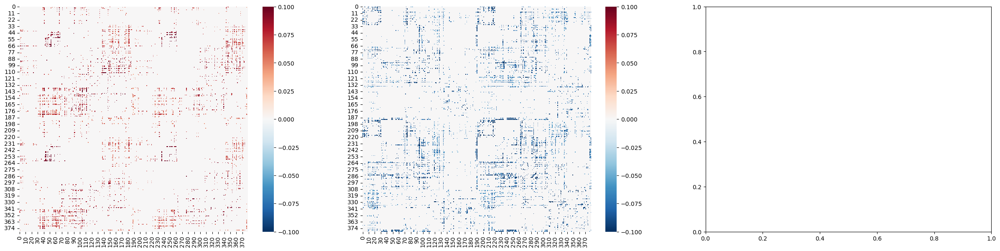

In [101]:
f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(30,7))
g1 = sns.heatmap(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self']*(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z']>= 1.96).astype(int), cmap='RdBu_r', vmin=-.1, vmax=.1, ax=ax1)
g2 = sns.heatmap(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self']*(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z']<= -1.96).astype(int), cmap='RdBu_r', vmin=-.1, vmax=.1, ax=ax2)

In [47]:
LME_RESULTS_Q.sort_values(by='Image_Pos_Others-Surr_Neg_Self.q')

,group.chisq2.q,Image_Pos_Others,Image_Pos_Others.q,Surr_Neg_Self,Surr_Neg_Self.q,Image_Pos_Others-Surr_Neg_Self,Image_Pos_Others-Surr_Neg_Self.q
25668,0.110149,0.236423,7.049400e-16,0.417540,6.528800e-16,-1.811160e-01,0.036168
31395,0.309225,0.148405,9.127280e-09,0.305530,6.528800e-16,-1.571260e-01,0.128299
31426,0.309225,0.291251,7.049400e-16,0.469499,6.528800e-16,-1.782480e-01,0.128299
34321,0.313685,0.130253,2.633710e-07,-0.024826,9.459110e-02,1.550790e-01,0.130015
31394,0.488227,0.206227,2.464930e-14,0.349061,6.528800e-16,-1.428340e-01,0.251788
...,...,...,...,...,...,...,...
37075,1.000000,0.137750,4.339770e-11,0.137754,5.446110e-11,-3.641480e-06,1.000000
12102,1.000000,0.050469,6.748080e-04,0.050468,6.622550e-04,9.005140e-07,1.000000
63443,1.000000,-0.064988,1.811640e-03,-0.064987,1.622000e-03,-3.909450e-07,1.000000
45062,1.000000,0.045497,1.355940e-02,0.045498,1.265210e-02,-6.713960e-07,1.000000


In [59]:
from bct.algorithms import get_components
from scipy.stats import norm

In [111]:
norm.sf(abs(2.5))*2

0.012419330651552265

In [116]:
adj = (LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z']<= -2.5).astype(int)
#adj = (LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z']>= 2.5).astype(int)

In [117]:
a, sz = get_components(adj)

# convert size from nodes to number of edges
# only consider components comprising more than one node (e.g. a/l 1 edge)
ind_sz, = np.where(sz > 1)
ind_sz += 1
nr_components = np.size(ind_sz)
sz_links = np.zeros((nr_components,))
for i in range(nr_components):
    nodes, = np.where(ind_sz[i] == a)
    sz_links[i] = np.sum(adj[np.ix_(nodes, nodes)]) / 2
    adj[np.ix_(nodes, nodes)] *= (i + 2)

# subtract 1 to delete any edges not comprising a component
adj[np.where(adj)] -= 1

# Show maximum component size
if np.size(sz_links):
    max_sz = np.max(sz_links)
else:
    # max_sz=0
    raise ValueError('Size of true matrix is zero - Degenerate!')
print('max component size is %i' % max_sz)

max component size is 1284


In [118]:
print(sz_links)

[1.000e+00 1.284e+03]


In [119]:
pd.DataFrame(adj).hvplot.heatmap(clim=(-1,1),cmap='viridis', aspect='square')

:HeatMap   [columns,index]   (value)

In [66]:
pd.DataFrame(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z']).hvplot.heatmap(aspect='square', cmap='RdBu_r')

:HeatMap   [columns,index]   (value)

In [74]:
pd.DataFrame(LME_results_matrixes['Image_Pos_Others-Surr_Neg_Self.Z']).hvplot.kde()

:NdOverlay   [Variable]
   :Distribution   [value]   (Density)